# Gas Turbine CO and NOx Emission Clustering

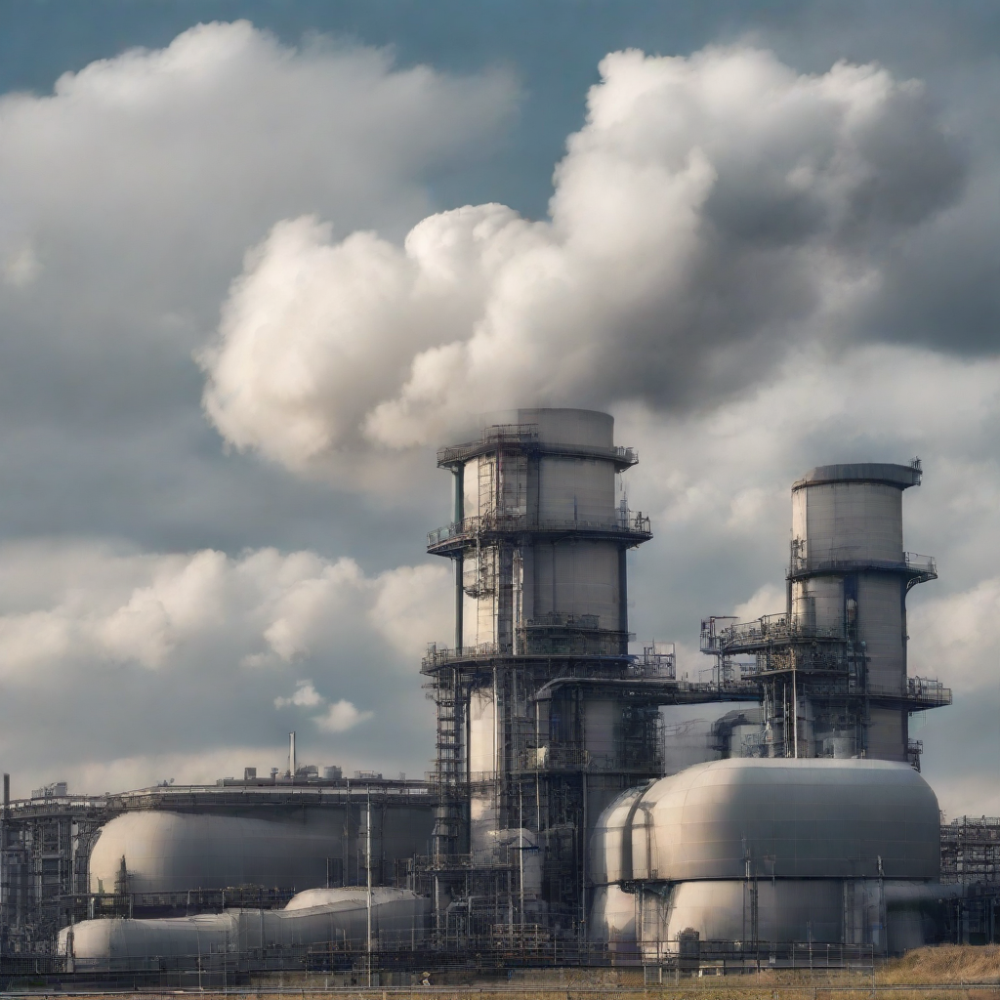

## Introduction

The used dataset is about gas emissions that is produced by the Gas Turbine that is located in the Western Region of Türkiye and it is obtained from the **UCI Machine Learning Repository**. <br> 
The citation is as follows; <br>
Gas Turbine CO and NOx Emission Data Set. (2019). <br>
UCI Machine Learning Repository. https://doi.org/10.24432/C5WC95.

In this project there is unlabeled data and it is clustered by using unsupervised machine learning algorithms such as *K-Means*, *DBSCAN* and *Gaussian Mixture Model*. 

Please see the feature abbreviations and their explanations in the below;

- **AT**: Ambient Temperature in C°
- **AP**: Ambient Pressure in mBar
- **AH**: Ambient Humidity in %
- **AFDP**: Air Filter Difference Pressure in mBar
- **GTEP**: Gas Turbine Exhaust Pressure in mBar
- **TIT**: Turbine Inlet Temperature in C° 
- **TAT**: Turbine After Temperature in C°
- **CDP**: Compressor Discharge Pressure in mBar
- **TEY**: Turbine Enery Yield in MWh
- **CO**: Carbon Monoxide in mg/m³
- **NOX**: Nitrogen Oxides in mg/m³

As it can be understod from the above explanations of the abbreviations, first 3 features are about environment effects, following 5 features are about gas turbine and its operative measurements and final 3 features about products of the gas turbine. Thus, **TEY**, **CO** and **NOX** features are assumed as the features that are going to be used in the evaluations of the models.

The project is originally formed by the **7 Step Approach** and in this notebook covers the general summaryof the applied methods and results. Consequently, please see the [**GitHub Repository shared in this link**](https://github.com/HasanUnlu09/Gas_Turbine_CO_and_NOx_Emission_Clustering) for more detailed studies.

## Table of Cantents

1. <a href='#data_acquiring_section'><b>Data Acquiring</b></a>
2. <a href='#data_cleaning_section'><b>Data Cleaning</b></a>
3. <a href='#data_exploration_section'><b>Data Exploration(EDA)</b></a>
    - 3.1. <a href='#univariate_analysis_section'><b>Univariate Analysis</b></a>
    - 3.2. <a href='#bivariate_analysis_section'><b>Bivariate Analysis</b></a>
4. <a href='#feature_engineering_section'><b>Feature Engineering</b></a>
5. <a href='#model_building_section'><b>Model Building</b></a>
    - 5.1. <a href='#kmeans_section'><b>K-Means</b></a>
    - 5.2. <a href='#dbscan_section'><b>Density-Based Spatial Clustering of Applications with Noise(DBSCAN)</b></a>
    - 5.3. <a href='#gmm_section'><b>Gussian Mixture Models(GMM)</b></a>
6. <a href='#model_evaluation_section'><b>Model Evaluation</b></a>
    - 6.1. <a href='#statistical_evaluation_section'><b>Statistical Evaluation</b></a>
    - 6.2. <a href='#visual_evaluation_section'><b>Visual Evaluation</b></a>
7. <a href='#conclusion_section'><b>Conclusion</b></a>

<a id='data_acquiring_section'></a>
## 1. Data Acquiring

As it mentioned in the *Introduction* section, the data is obtained from the UCI ML Repository and there were 5 different csv files. Thus, these files are merged to a single file and stored in the *CO_NOx_Emissions.csv* file. If you would like to study the merging process please see the *2. Data_Mining.ipynb* file that is shared in the GitHub Repositor which is shared in the GitHub link in the Introduction section above..

In [1]:
import pandas as pd

In [132]:
data = pd.read_csv('CO_NOx_Emissions.csv')

In [133]:
data.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


<a id='data_cleaning_section'></a>
## 2. Data Cleaning

In [127]:
# Missing value check
data.isna().value_counts()

AT     AP     AH     AFDP   GTEP   TIT    TAT    TEY    CDP    CO     NOX  
False  False  False  False  False  False  False  False  False  False  False    36733
dtype: int64

In [128]:
# Data type check
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36733 entries, 0 to 36732
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      36733 non-null  float64
 1   AP      36733 non-null  float64
 2   AH      36733 non-null  float64
 3   AFDP    36733 non-null  float64
 4   GTEP    36733 non-null  float64
 5   TIT     36733 non-null  float64
 6   TAT     36733 non-null  float64
 7   TEY     36733 non-null  float64
 8   CDP     36733 non-null  float64
 9   CO      36733 non-null  float64
 10  NOX     36733 non-null  float64
dtypes: float64(11)
memory usage: 3.1 MB


In [21]:
data[data.duplicated() == True]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
26399,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26400,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26401,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26402,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
27389,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27390,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27391,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564


The dataset is quite clean. However, there are duplicated data in the dataset but they remains due to small portion. Also, there is no missing value or data type inconsitency.

<a id='data_exploration_section'></a>
## 3. Data Exploration(EDA)

<a id='univariate_analysis_section'></a>
### 3.1 Univariate Analysis

In [35]:
# Statistical Representation of The Features

In [28]:
from scipy.stats import skew, kurtosis, iqr

# Exploring the characteristics of the features
for i,j in enumerate(data.columns):

    # The Feature
    print('\n-------------------------------')
    print('The Feature is ---> %s' % j )
    
    # Skeweness, Kurtosis and IQR(Inter Quartile Range) of the feature
    print('\nSkeweness: %f' % skew(data[j]))
    print('Kurtorsis: %f' % kurtosis(data[j]))
    print('IQR: %f' % iqr(data[j]))

    # Range, Mean and Standard Deviation of the feature
    print('\nRange: [%f, %f]' % (data[j].min(), data[j].max()))
    print('Mean: %f' % data[j].mean(numeric_only=True))
    print('Standard Deviation: %f' % data[j].std())
    print('-------------------------------')


-------------------------------
The Feature is ---> AT

Skeweness: -0.043545
Kurtorsis: -0.826651
IQR: 11.884000

Range: [-6.234800, 37.103000]
Mean: 17.712726
Standard Deviation: 7.447451
-------------------------------

-------------------------------
The Feature is ---> AP

Skeweness: 0.194113
Kurtorsis: 0.441770
IQR: 8.200000

Range: [985.850000, 1036.600000]
Mean: 1013.070165
Standard Deviation: 6.463346
-------------------------------

-------------------------------
The Feature is ---> AH

Skeweness: -0.628008
Kurtorsis: -0.274716
IQR: 21.188000

Range: [24.085000, 100.200000]
Mean: 77.867015
Standard Deviation: 14.461355
-------------------------------

-------------------------------
The Feature is ---> AFDP

Skeweness: 0.381081
Kurtorsis: 0.224432
IQR: 1.021300

Range: [2.087400, 7.610600]
Mean: 3.925518
Standard Deviation: 0.773936
-------------------------------

-------------------------------
The Feature is ---> GTEP

Skeweness: 0.329008
Kurtorsis: -0.653927
IQR: 5.93200

---

In [36]:
# Graphical Representation of The Features

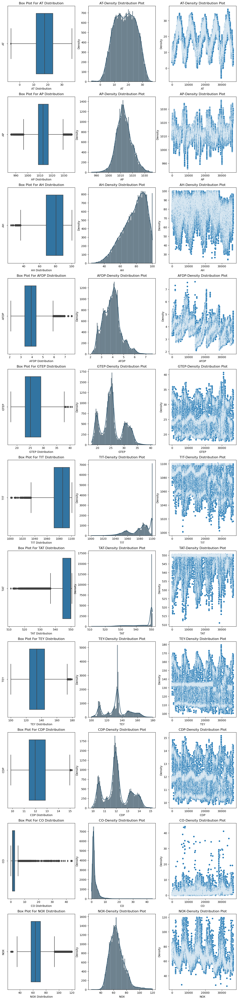

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,65))
for i,j in enumerate(data.columns):
    
    # Box plots in the first column
    plt.subplot(11,3, 3*i+1)
    ax = sns.boxplot(x=data[j])
    ax.set(xlabel=j+' Distribution', ylabel=j, title='Box Plot For '+j+' Distribution')

    # Distribution plots in the second column
    plt.subplot(11,3, 3*i+2)
    ax = sns.histplot(data[j], kde=True, bins=100, color='#154360')
    ax.set(xlabel=j, ylabel='Density', title=j+'-Density Distribution Plot')

    # Scatter plots in the second column
    plt.subplot(11,3, 3*i+3)
    ax = sns.scatterplot(data, x=data.index, y=j)
    ax.set(xlabel=j, ylabel='Density', title=j+'-Density Distribution Plot')
    

According to above results;
<br>**AT** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**AP** —> It has **Leptokurtic** and **nearly symmetrical** data distribution characteristic
<br>**AH** —> It has **Leptokurtic** and **slightly negative skewed** data distribution characteristic
<br>**AFDP** —> It has **Leptokurtic** and **nearly symmetrical** data distribution characteristic
<br>**GTEP** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**TIT** —> It has **Platykurtic** and **slightly negative skewed** data distribution characteristic
<br>**TAT** —> It has **Leptokurtic** and **extremely negative skewed** data distribution characteristic
<br>**TEY** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**CDP** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**CO** —> It has **Leptokurtic** and **extremely positive skewed** data distribution characteristic
<br>**NOX** —> It has **Leptokurtic** and **extremely positive skewed** data distribution characteristic

---

In [ ]:
# Outlier Removal Section

Below ranges defines the ranges of the features to remove outliers in the dataset; <br>
AT > 0 <br>
990 < AP < 1030 <br>
AH > 30 <br>
AFDP < 6.5 <br>
GTEP < 37 <br>
TIT > 1030 <br>
TAT > 520 <br>
TEY < 170 <br>
CDP < 14.5 <br>
CO < 15 <br>
NOX > 42 <br>

In [134]:
# Outlier Removal
data = data[data.loc[:, 'AT'] > 0]
data = data[data.loc[:, 'AP'] >= 990]
data = data[(data.loc[:, 'AP'] <= 1030)]
data = data[data.loc[:, 'AH'] >= 30]
data = data[data.loc[:, 'AFDP'] <= 6.5]
data = data[data.loc[:, 'GTEP'] <= 37]
data = data[data.loc[:, 'TIT'] >= 1030]
data = data[data.loc[:, 'TAT'] >= 520]
data = data[data.loc[:, 'TEY'] <= 170]
data = data[data.loc[:, 'CDP'] <= 14.5]
data = data[data.loc[:, 'CO'] <= 15]
data = data[data.loc[:, 'NOX'] >= 42]

In [135]:
data.shape

(35917, 11)

<a id='bivariate_analysis_section'></a>
### 3.2 Bivariate Analysis

Text(0.5, 1.0, 'Correlation of The Features')

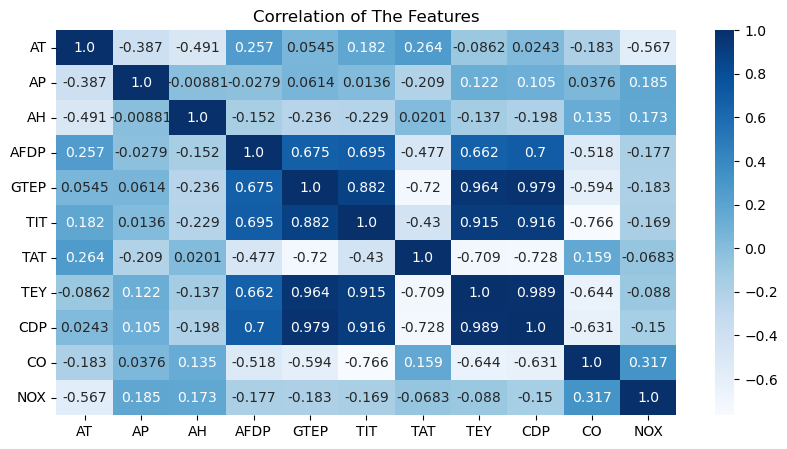

In [39]:
# Plotting Correlation Heatmap of the dataset 
correlation = data.corr()
plt.figure(figsize=(10,5))
sns.heatmap(correlation, annot=True, cmap='Blues', fmt='.3')
plt.title('Correlation of The Features')

Text(0.5, 1.0, 'Correlation of The Features')

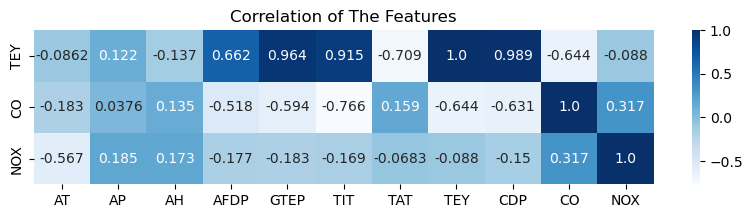

In [47]:
# Plotting Correlation Heatmap of the dataset for only TEY, CO and NOX
correlation = data.corr()
plt.figure(figsize=(10,2))
sns.heatmap(correlation.loc[['TEY', 'CO', 'NOX'], :], annot=True, cmap='Blues', fmt='.3')
plt.title('Correlation of The Features')

As it can be seen from above correlation heatmaps, <br> 

**AFDP**, **GTEP**, **TIT**, **TAT**, **CDP** and **CO** features have high correlation with the **TEY** feature. <br> 
**AFDP**, **GTEP**, **TIT**, **TEY** and **CDP** features have high correlation with the **CO** feature. <br> 
There is no strong correlation for **NOX** feature but **CO** feature have moderate correlation with the **NOX** feature. <br> 
These correalation segments can be heplful for further steps.

<a id='feature_engineering_section'></a>
### 4. Feature Engineering

Before starting this section, it should be mentioned that there is no feature to be encoded and all features remains despite there is some strongly correlated features.

In [ ]:
# Features before scaling operation

Text(0.5, 1.0, 'Distribution Plot Before Scaling')

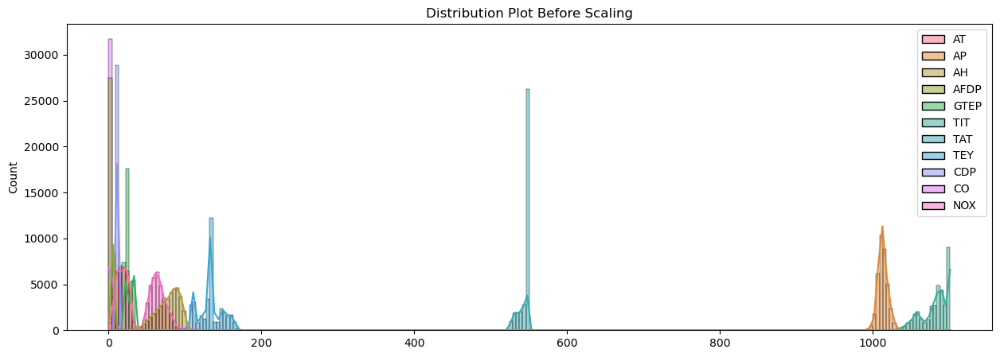

In [62]:
plt.figure(figsize=(15,5))
sns.histplot(data, kde=True, bins=250)
plt.title('Distribution Plot Before Scaling')

In [ ]:
# Feature Scaling - Normalization

Text(0.5, 1.0, 'Distribution Plot After Scaling')

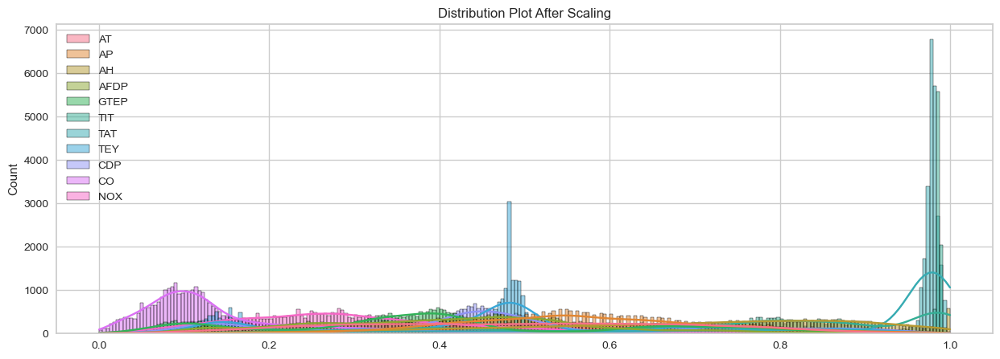

In [137]:
from sklearn.preprocessing import MinMaxScaler
normalized_data = data.copy(deep=True)
scaler = MinMaxScaler()
normalized_data[normalized_data.columns] = scaler.fit_transform(normalized_data)
plt.figure(figsize=(15,5))
sns.histplot(normalized_data, kde=True, bins=250)
plt.title('Distribution Plot After Scaling')

As it can be seen from the above plots, the data is transferred between 0 and 1 with the a bit more gaussian shaped distribution.

<a id='model_building_section'></a>
### 5. Model Building

The dataset is reduced to a smaller portion of itself due to heavy computation.

In [138]:
print(normalized_data.shape)
print('!!! Dataset is reduced to a smaller portion of itself due to heavy computational reasons')
normalized_data = normalized_data.loc[:22191, :]
print(normalized_data.shape)

(35917, 11)
!!! Dataset is reduced to a smaller portion of itself due to heavy computational reasons
(21886, 11)


In [75]:
# predictions data frame to hold predicted results
predictions = pd.DataFrame()

<a id='kmeans_section'></a>
### 5.1. K-Means

Before begin, there is no strictly defined cluster number. Therefore, best number of clusters ,that can be predicted by the KMeans algorithm, needs to be determined. In order to overcome this issue, *Elbow Method* is used with **KElbowVisulizer** from **YellowBrick** library and *Silhouette Plot* is used to show how well the cluster number performs and it is accomplished by the **SilhouetteVisualizer** from **YellowBrick** library.

In [71]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

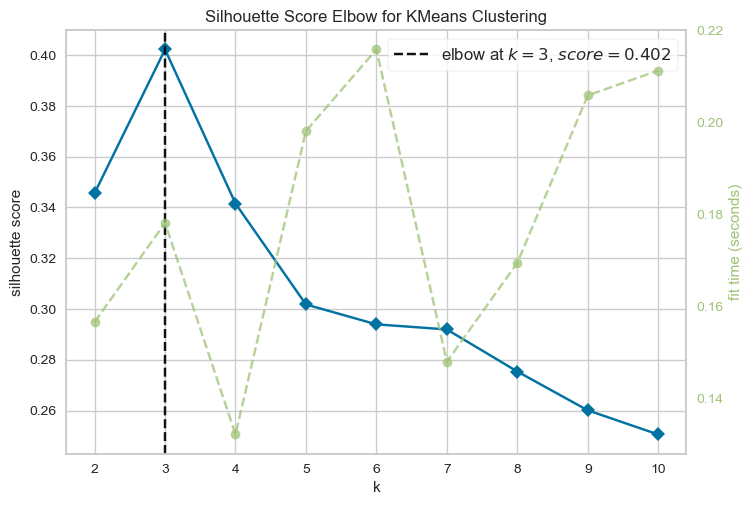

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [73]:
elbow = KElbowVisualizer(KMeans(n_init='auto'), 
                         k=(2,11),
                         metric='silhouette')
elbow.fit(normalized_data)
elbow.show()

**!!!** It must be mentioned that KMeans model starts randomly selected centroids for the clusters and this chaotic/random structure of the model might leads to a different cluster numbers that is represented above graph. 

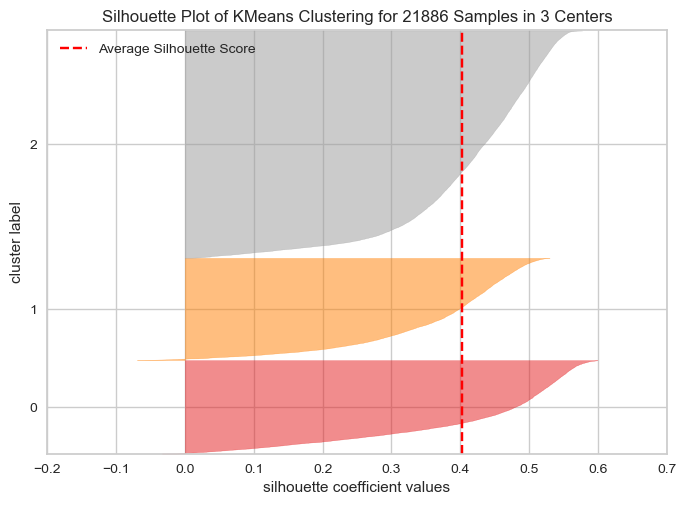

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 21886 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [74]:
silhouette_visualizer = SilhouetteVisualizer(KMeans(n_clusters=3, n_init='auto'))
silhouette_visualizer.fit(normalized_data)
silhouette_visualizer.show()

In [139]:
# predictions
kmeans = KMeans(n_clusters=3, n_init='auto')
kmeans_pred = kmeans.fit_predict(normalized_data)

In [140]:
# obtained predictions are assigned to a new column in the transform data
predictions['KMeans_Cluster'] = kmeans_pred

<a id='dbscan_section'></a>
### 5.2. Density-Based Spatial Clustering of Applications with Noise(DBSCAN)

In the DBSCAN algorithm, there are two extremely important variables as **Epsilon** and **Minimum Samples**.<br>
- **eps**: Epsilon ---> Radius of a data point
- **min_samples**: Minimum Samples ---> minimum number of data points that can be in the data point circle with epsilon radius

**Epsilon** can be determined by using maximum curvature of the **K-Distance Graph** and K-Distance graph is formed by using distance values that come from NearestNeighbors algorithm.<br>
**Minimum Samples** are generally determined as **2**x**Dimensions**. However, it can be determined as the domain knowledge suggested.<br>
<br>
One of the advantages of the DBSCAN model is the noise determination. After clustering, the model returns one extra cluster as **-1** that represents **noise**.

In [ ]:
# Determination of Epsilon and Min_Samples
# K-Distance Graph

In [83]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

In [93]:
# distance determination between each two data points
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fitted = neighbors.fit(normalized_data)
distances, indices = neighbors_fitted.kneighbors(normalized_data)

Text(0.5, 1.0, 'K-Distance Graph For Online Retail Dataset')

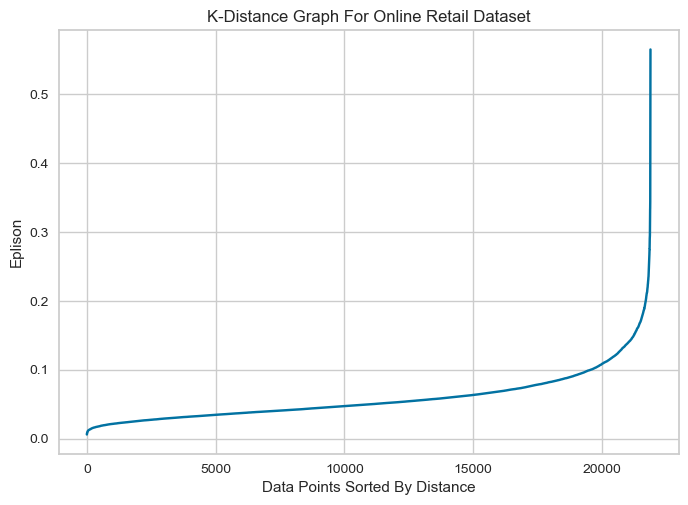

In [94]:
# K-Distance Graph
distances = np.sort(distances, axis=0)[:,1]
plt.plot(distances)
plt.xlabel('Data Points Sorted By Distance')
plt.ylabel('Eplison')
plt.title('K-Distance Graph For Online Retail Dataset')

According to the K-Distance Graph, maximum curvature should be around 0.15. Therefore, Epsilon is assumed as **eps=0.155**.\
Minimum sample is determined as **min_samples = 2\*(Number of Features)** ---> min_samples = 2*11 = 22

In [ ]:
# Model fitting and predictions

In [96]:
from sklearn.cluster import DBSCAN

In [141]:
# model is defined and cluster predictions are obtained
dbscan = DBSCAN(eps=0.155, min_samples=22)
dbscan.fit(normalized_data)

DBSCAN(eps=0.155, min_samples=22)

In [142]:
# obtained predictions are assigned to a new column in the predictions
predictions['DBSCAN_Cluster'] = dbscan.labels_

In [143]:
# all clusters and their counts with NOISE
predictions['DBSCAN_Cluster'].value_counts()

 0    18671
-1     3132
 1       45
 2       19
 3       19
Name: DBSCAN_Cluster, dtype: int64

<a id='gmm_section'></a>
### 5.3. Gussian Mixture Models(GMM)

This method expects determined number of clusters and it is determined as 3 as it was shown in the KElbowVisualizer method in K-Means secction.

In [108]:
from sklearn.mixture import GaussianMixture

In [144]:
gmm = GaussianMixture(n_components=3)
gmm_pred = gmm.fit_predict(normalized_data)

In [145]:
# obtained predictions are assigned to a new column in the transform data
predictions['GMM_Cluster'] = gmm_pred

---

In [146]:
print('\nK-Means\n', predictions.KMeans_Cluster.value_counts())
print('\nDBSCAN\n',predictions.DBSCAN_Cluster.value_counts())
print('\nGMM\n',predictions.GMM_Cluster.value_counts())


K-Means
 0    11772
1     5284
2     4830
Name: KMeans_Cluster, dtype: int64

DBSCAN
  0    18671
-1     3132
 1       45
 2       19
 3       19
Name: DBSCAN_Cluster, dtype: int64

GMM
 0    9749
2    7446
1    4691
Name: GMM_Cluster, dtype: int64


<a id='model_evaluation_section'></a>
## 6. Model Evaluation

As it is explained in the Introduction section, there is no pre-determined class/cluster for a data point. Therefore, models are performed on unlabeled data and labeled the data by the model algorithm suggests. Therefore, every model created diffrent cluster and amount of data points in that cluster. Therefore, there is two types of approach is adopted here as statistical and visual evaluation.

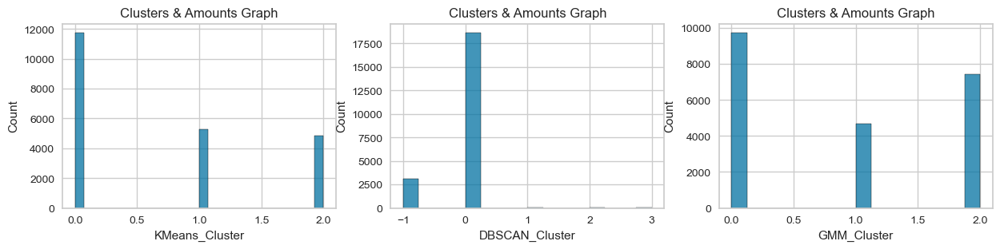

In [178]:
# clusters and their data point amounts
plt.figure(figsize=(15,3))
for i,j in enumerate(predictions):
    plt.subplot(1,3, i+1)
    ax = sns.histplot(predictions[j])
    ax.set(title='Clusters & Amounts Graph')

<a id='statistical_evaluation_section'></a>
### 6.1. Statistical Evaluation

In the statistical evaluation section, there are 3 metric is used to evaluate model results. In this project only **Internal Validation** methods are used and *External Validation* metrics couldnn't be used due to absence of pre-determined labels. Used *internal validation* metrics are as follows;
**Silhouette Score**, **Davies-Bouldin Index** and **Calinski-Harabasz Index**. 

---

#### Silhouette Scores

In the Silhouette Scores, results vary between -1 and +1.

**-1** represents the data points might be *mis-clustered*, **0** represents the data points might be at the bounday of the clusters which leads to mis-clustering. **+1** represents the data points might be well clustered.

In [119]:
from sklearn.metrics import silhouette_score

In [153]:
kmeans_ss = silhouette_score(normalized_data, predictions.KMeans_Cluster)
dbscan_ss = silhouette_score(normalized_data, predictions.DBSCAN_Cluster)
gmm_ss = silhouette_score(normalized_data, predictions.GMM_Cluster)

Text(0.5, 1.0, 'Silhouette Scores Of The Models')

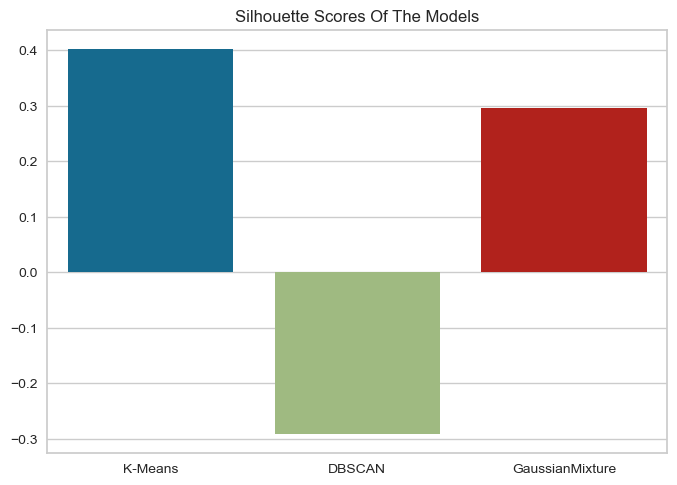

In [162]:
ss_df = pd.DataFrame(data={'K-Means':kmeans_ss, 'DBSCAN':dbscan_ss, 'GaussianMixture':gmm_ss}, index=[0])
sns.barplot(ss_df)
plt.title('Silhouette Scores Of The Models')

As the above plot shows the best result comes from K-Means algorithm due to having of highest positive result.

#### Davies-Bouldin Index

This index will result in better result if the dataset clusters are all separated. And higher value represent worse results and lower results are desired scores.

In [163]:
from sklearn.metrics import davies_bouldin_score

In [169]:
kmeans_dbi = davies_bouldin_score(normalized_data, predictions.KMeans_Cluster)
dbscan_dbi = davies_bouldin_score(normalized_data, predictions.DBSCAN_Cluster)
gmm_dbi = davies_bouldin_score(normalized_data, predictions.GMM_Cluster)

Text(0.5, 1.0, 'Davies-Bouldin Indexes Of The Models')

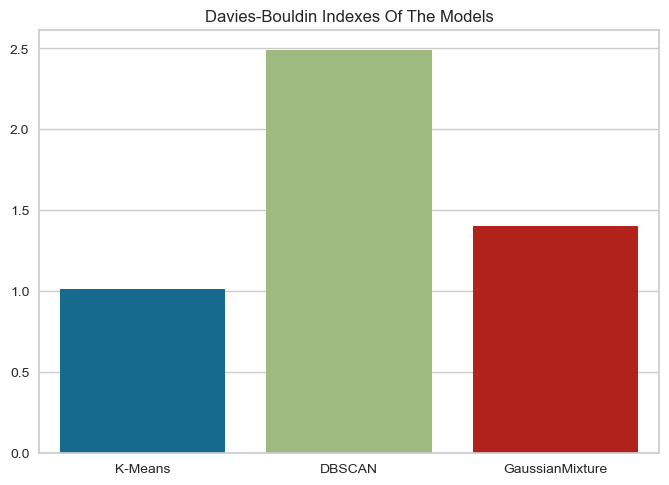

In [170]:
dbi_df = pd.DataFrame(data={'K-Means':kmeans_dbi, 'DBSCAN':dbscan_dbi, 'GaussianMixture':gmm_dbi}, index=[0])
sns.barplot(dbi_df)
plt.title('Davies-Bouldin Indexes Of The Models')

As the above plot shows the best result comes from K-Means algorithm due to having of lowest result.

####  Calinski-Harabasz Index

Well separated and dense clustered models will result in higher value of score. However, there is no limitation or cut off edge for wellness determination of the clusters.

In [166]:
from sklearn.metrics import calinski_harabasz_score

In [167]:
kmeans_chi = calinski_harabasz_score(normalized_data, predictions.KMeans_Cluster)
dbscan_chi = calinski_harabasz_score(normalized_data, predictions.DBSCAN_Cluster)
gmm_chi = calinski_harabasz_score(normalized_data, predictions.GMM_Cluster)

Text(0.5, 1.0, 'Calinski-Harabasz Indexes Of The Models')

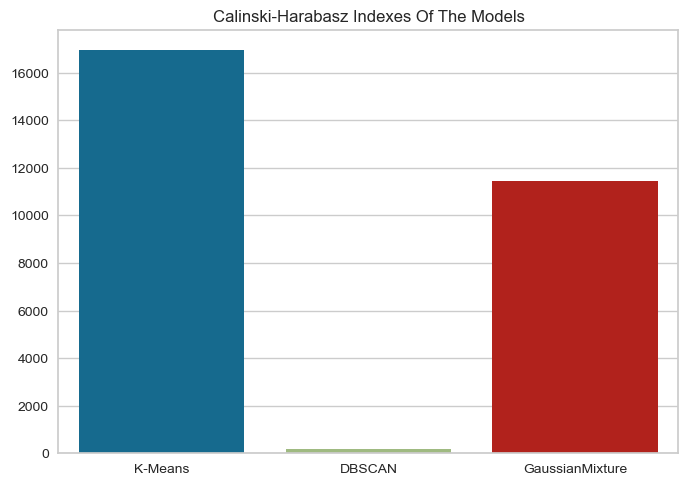

In [171]:
chi_df = pd.DataFrame(data={'K-Means':kmeans_chi, 'DBSCAN':dbscan_chi, 'GaussianMixture':gmm_chi}, index=[0])
sns.barplot(chi_df)
plt.title('Calinski-Harabasz Indexes Of The Models')

As the above plot shows the best result comes from K-Means algorithm due to having of highest result.

<a id='visual_evaluation_section'></a>
### 6.2. Visual Evaluation

In [172]:
# assigning predictions to the transformed data to increase usability of the code
for i in predictions.columns: 
    normalized_data[i] = predictions[i].values

In [173]:
noise = '#C0392B' # red
cluster0 = '#F39C12' #  orange
cluster1 = '#1F618D' # blue
cluster2 = '#000000' # black
cluster3 = '#5B2C6F' # purple
cluster4 = '#239B56' # green
cluster5 = '#5F6A6A' # grey
cluster6 = '#5D6D7E' # another grey

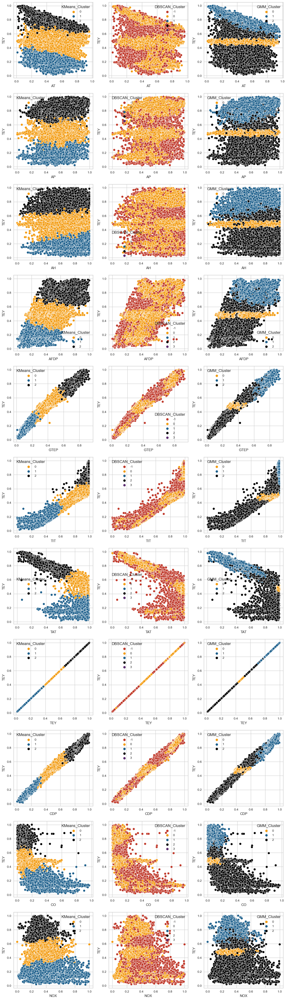

In [174]:
# all the plots show that change of data point with respect to TEY feature
# because TEY is used here as expected output feature
plt.figure(figsize=(15,55))
for i,j in enumerate(normalized_data.columns[0:11]):
    
    # KMeans_Cluster
    plt.subplot(11,3, 3*i+1)
    sns.scatterplot(normalized_data, 
                    x=j, 
                    y='TEY', hue='KMeans_Cluster', 
                    palette={-1:noise, 0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

    # DBSCAN_Cluster
    plt.subplot(11,3, 3*i+2)
    sns.scatterplot(normalized_data, 
                    x=j, 
                    y='TEY', hue='DBSCAN_Cluster', 
                    palette={-1:noise, 0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

    # GMM_Cluster
    plt.subplot(11,3, 3*i+3)
    sns.scatterplot(normalized_data, 
                    x=j, 
                    y='TEY', hue='GMM_Cluster', 
                    palette={-1:noise, 0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

<Axes: ylabel='TEY'>

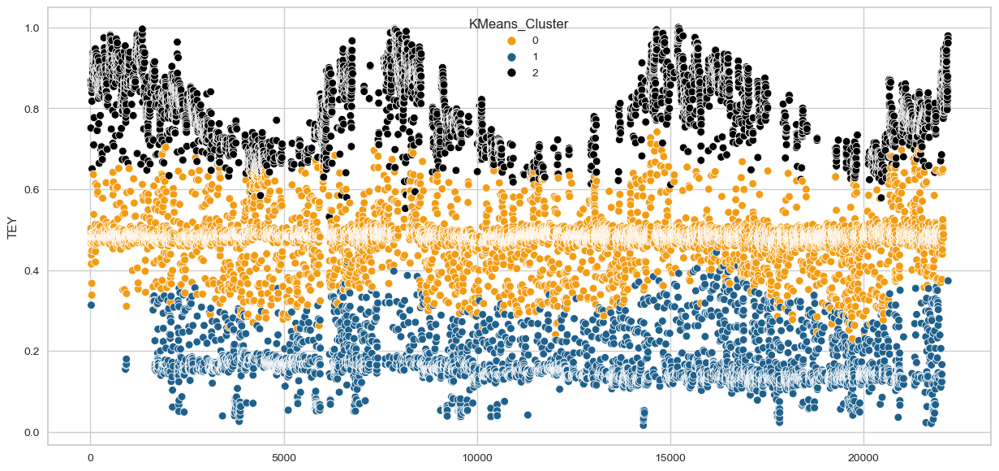

In [175]:
# KMeans_Cluster clustering on TEY feature
plt.figure(figsize=(15,7))
sns.scatterplot(normalized_data, 
                x=normalized_data.index, 
                y='TEY', hue='KMeans_Cluster', 
                palette={-1:noise, 0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

<Axes: ylabel='TEY'>

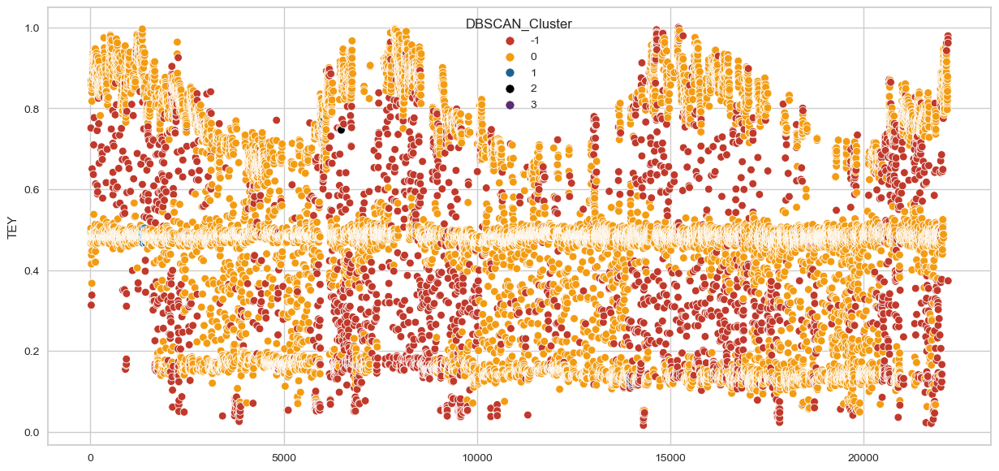

In [176]:
# DBSCAN_Cluster clustering on TEY feature
plt.figure(figsize=(15,7))
sns.scatterplot(normalized_data, 
                x=normalized_data.index, 
                y='TEY', hue='DBSCAN_Cluster', 
                palette={-1:noise, 0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

<Axes: ylabel='TEY'>

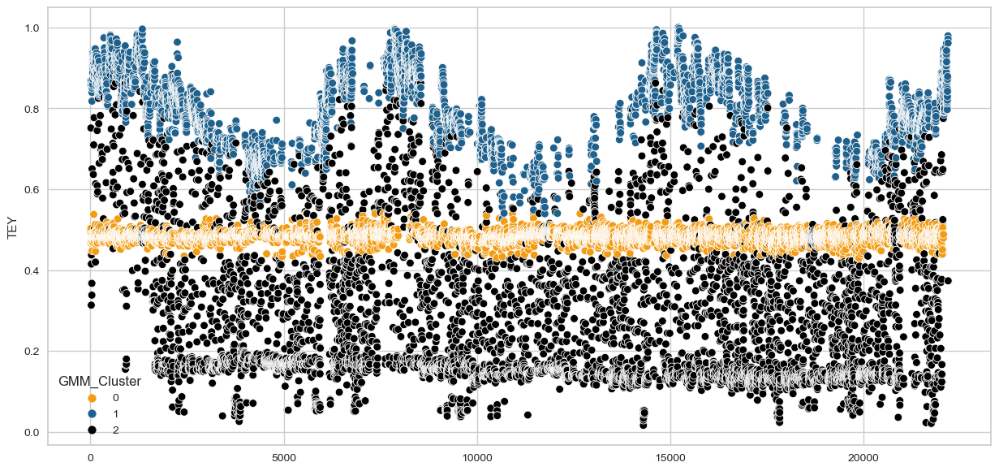

In [177]:
# GMM_Cluster clustering on TEY feature
plt.figure(figsize=(15,7))
sns.scatterplot(normalized_data, 
                x=normalized_data.index, 
                y='TEY', hue='GMM_Cluster', 
                palette={0:cluster0, 1:cluster1, 2:cluster2, 3:cluster3, 4:cluster4, 5:cluster5, 6:cluster6})

<a id='conclusion_section'></a>
## 7. Conclusion

In this project, 3 most popular **Unsupervised Clustering Machine Learning Algorithms** are applied to the **normalized dataset**. As a result of these algorithms might be summarized as follows;

- **K-Means**: This is the best performed method on the *normalized dataset*. Since, the dataset is prone to be represented by the spherical clusters and this situation leads to the KMeans model capture the clusters better than others. Also, this method performed better than other methods for *Silhouette Score*, *Davies-Bouldin Index* and *Calinski-Harabasz Index* evaluation merics.
- **DBSCAN**: This is the worst performed method on the *normalized dataset*. Since, all the data points are scattered with similar density points around the entire dataset for most of the features. This situation leads to mis-clustering and clustering as a noise by the DBSCAN.
- **GaussianMixtureModel**: This is the moderately performed method on the *normalized dataset*. The model assumes that dataset features have Gaussian distributions and it uses these normally distributed features for clustering. However, some of the features have no normal distributions and the other ones only have similarity to normal distribution. Therefore, model performed moderately.

---